In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import sys

 **Q1:** Write a function def ConvolutionOperation ( image, kernel): that has arguments
- Image (Images may be of varying sizes and you may want to give the size as arguments. You can use the shape property in python.)
- Kernel H (Again, you should allow varying size Kernels.)

The output of the function should be the convolution of I with H. Test your function and show results on the following Kernels, using the provided sample images within the assignment.

- i) Averaging Kernel (3x3, 5x5, and 7x7)
- ii) Gaussian Kernel (σ = 1 with kernel size 3 x 3, 5 x 5, and 7 x 7)
- iii) Sobel Edge Operators:

                  -1 -2 -1           -1  0  1
                 [ 0  0  0 ]  and  [ -2  0  2 ]
                   1  2  1           -1  0  1
- iv) Prewitt Edge Operators:

                  -1  0  1           1   1   1
                 [-1  0  1 ]  and  [ 0   0   0 ]
                  -1  0  1          -1  -1  -1
- v) Laplacian Operators:

                   1   1  1
                 [ 1  -8  1 ]
                   1   1  1

Note: You must perform convolution by writing your own code and comparing it with the result of the cv2.filter2D()

**Marks : 45 + 5 points**


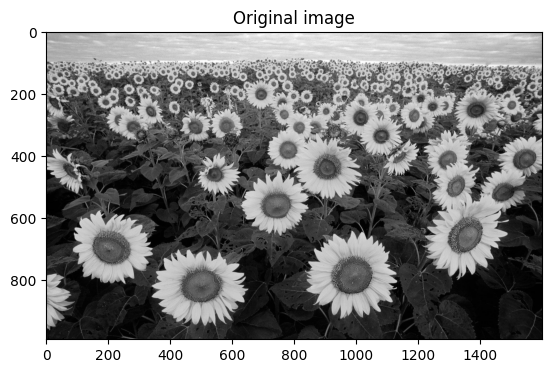

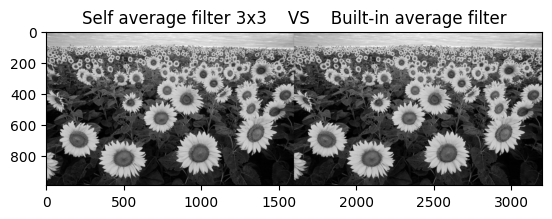

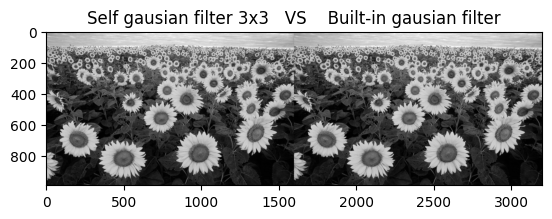

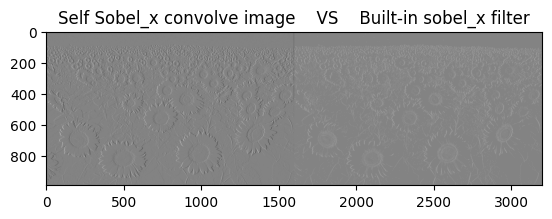

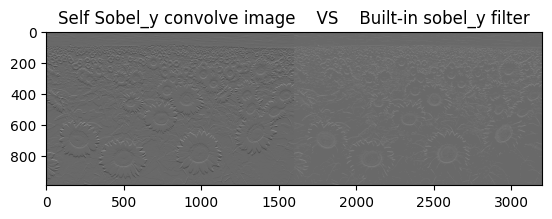

...

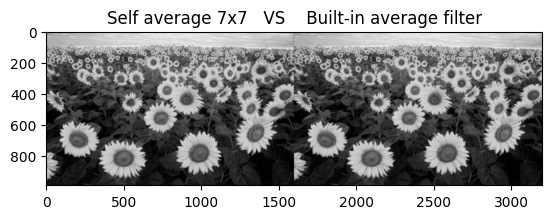

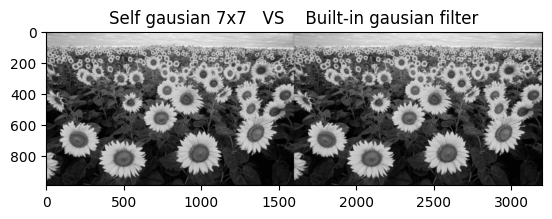

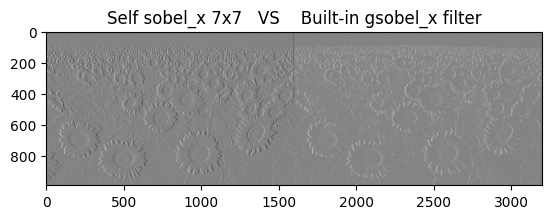

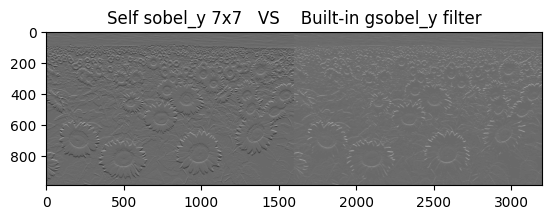

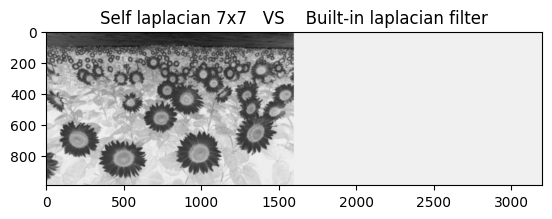

In [9]:
def ConvolutionOperation(image, kernel):
  # Pad the image with the size of the kernel.
  padded_image = np.pad(image, [(kernel.shape[0] // 2, kernel.shape[0] // 2),
                                 (kernel.shape[1] // 2, kernel.shape[1] // 2)],
                         mode='constant')

  output_image = np.zeros(image.shape)

  # Iterate over the image and perform convolution at each pixel.
  for i in range(image.shape[0]):
    for j in range(image.shape[1]):
      # Get the kernel window around the current pixel.
      kernel_window = padded_image[i:i + kernel.shape[0],
                                  j:j + kernel.shape[1]]

      #convolution operation
      output_image[i, j] = np.sum(kernel_window * kernel)

  return output_image

#define all 3x3 kernals
averaging_kernel = np.ones((3, 3), dtype=np.float32) / 9
gaussian_kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]], dtype=np.float32) / 16
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float32)
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)
laplacian_kernel = np.array([[1, 1, 1], [1, -8, 1], [1, 1, 1]], dtype=np.float32)


image = cv2.imread("flower.jpg",cv2.IMREAD_GRAYSCALE)            # read the image.
# Display the original and convolved images.
plt.imshow(image, cmap='gray')
plt.title("Original image")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
averaging_convolved_image = ConvolutionOperation(image, averaging_kernel)

# Perform convolution on 3x3 kernels by using built-in function
averaging_builtin_convolved_image = cv2.filter2D(image, -1, averaging_kernel)
#show average filered img:

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([averaging_convolved_image, averaging_builtin_convolved_image])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self average filter 3x3    VS    Built-in average filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
gausian_convolved_image = ConvolutionOperation(image, gaussian_kernel)

# Perform convolution on 3x3 kernels by using built-in function
gaus_builtin_convolved_image = cv2.filter2D(image, -1,  gaussian_kernel)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([gausian_convolved_image, gaus_builtin_convolved_image])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self gausian filter 3x3   VS    Built-in gausian filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
self = ConvolutionOperation(image, sobel_x)

# Perform convolution on 3x3 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  sobel_x)


#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self Sobel_x convolve image    VS    Built-in sobel_x filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
self = ConvolutionOperation(image, sobel_y)

# Perform convolution on 3x3 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  sobel_y)


#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self Sobel_y convolve image    VS    Built-in sobel_y filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
self = ConvolutionOperation(image, prewitt_x)

# Perform convolution on 3x3 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  prewitt_x)


#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self prewitt_x convolve image    VS    Built-in prewitt_x filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
self = ConvolutionOperation(image, prewitt_y)

# Perform convolution on 3x3 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  prewitt_y)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self prewitt_y convolve image    VS    Built-in prewitt_y filter")
plt.show()

# Perform convolution on 3x3 kernels by using self written function
self = ConvolutionOperation(image, laplacian_kernel)

# Perform convolution on 3x3 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  laplacian_kernel)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self laplacian convolve image    VS    Built-in laplacian filter")
plt.show()

'''Now start 5x5 kernels'''

averaging_kernel_5x5 = np.ones((5, 5), dtype=np.float32) / 25
# Perform convolution on 5x5 kernels by using self written function
self = ConvolutionOperation(image, averaging_kernel_5x5)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  averaging_kernel_5x5)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self average 5x5     VS    Built-in average filter")
plt.show()

#gausian 5x5
gaussian_kernel_5x5 = np.array([[2, 4, 5, 4, 2],
                                [4, 9, 12, 9, 4],
                                [5, 12, 15, 12, 5],
                                [4, 9, 12, 9, 4],
                                [2, 4, 5, 4, 2]], dtype=np.float32) / 159
self = ConvolutionOperation(image, gaussian_kernel_5x5)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  gaussian_kernel_5x5)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self gausian 5x5     VS    Built-in gausian filter")
plt.show()

#sobel_x
sobel_x = np.array([[-1, -2, 0, 2, 1],
                    [-4, -8, 0, 8, 4],
                    [-6, -12, 0, 12, 6],
                    [-4, -8, 0, 8, 4],
                    [-1, -2, 0, 2, 1]], dtype=np.float32) / 256
self = ConvolutionOperation(image, sobel_x)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  sobel_x)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self sobel_x 5x5     VS    Built-in sobel_x filter")
plt.show()

#sobel_y
sobel_y = np.array([[-1, -4, -6, -4, -1],
                    [-2, -8, -12, -8, -2],
                    [0, 0, 0, 0, 0],
                    [2, 8, 12, 8, 2],
                    [1, 4, 6, 4, 1]], dtype=np.float32) / 256
self = ConvolutionOperation(image, sobel_y)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  sobel_y)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self sobel_y 5x5     VS    Built-in sobel_y filter")
plt.show()

#laplacian 5x5
laplacian_kernel = np.array([[-4, -1, 0, -1, -4],
                            [-1, 2, 3, 2, -1],
                            [0, 3, 4, 3, 0],
                            [-1, 2, 3, 2, -1],
                            [-4, -1, 0, -1, -4]], dtype=np.float32) / 8
self = ConvolutionOperation(image, laplacian_kernel)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  laplacian_kernel)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self laplacian 5x5     VS    Built-in laplacian filter")
plt.show()

# now Define the 7x7 kernels
averaging_kernel_7x7 = np.ones((7, 7), dtype=np.float32) / 49
# Perform convolution on 5x5 kernels by using self written function
self = ConvolutionOperation(image, averaging_kernel_7x7)

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  averaging_kernel_7x7)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self average 7x7   VS    Built-in average filter")
plt.show()

#gausian filter 7x7
gaussian_kernel_7x7 = np.array([[1, 1, 2, 2, 2, 1, 1],
                                [1, 2, 2, 4, 2, 2, 1],
                                [2, 2, 4, 8, 4, 2, 2],
                                [2, 4, 8, 16, 8, 4, 2],
                                [2, 2, 4, 8, 4, 2, 2],
                                [1, 2, 2, 4, 2, 2, 1],
                                [1, 1, 2, 2, 2, 1, 1]], dtype=np.float32) / 140
self = ConvolutionOperation(image, gaussian_kernel_7x7 )

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1,  gaussian_kernel_7x7 )

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self gausian 7x7   VS    Built-in gausian filter")
plt.show()

#sobel x 7x7
sobel_x = np.array([[-1, -2, -3, 0, 3, 2, 1],
                    [-2, -4, -6, 0, 6, 4, 2],
                    [-3, -6, -9, 0, 9, 6, 3],
                    [-4, -8, -12, 0, 12, 8, 4],
                    [-3, -6, -9, 0, 9, 6, 3],
                    [-2, -4, -6, 0, 6, 4, 2],
                    [-1, -2, -3, 0, 3, 2, 1]], dtype=np.float32) / 168
self = ConvolutionOperation(image, sobel_x )

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1, sobel_x )

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self sobel_x 7x7   VS    Built-in gsobel_x filter")
plt.show()

#sobel y 7x7
sobel_y = np.array([[-1, -2, -3, -4, -3, -2, -1],
                    [-2, -4, -6, -8, -6, -4, -2],
                    [-3, -6, -9, -12, -9, -6, -3],
                    [0, 0, 0, 0, 0, 0, 0],
                    [3, 6, 9, 12, 9, 6, 3],
                    [2, 4, 6, 8, 6, 4, 2],
                    [1, 2, 3, 4, 3, 2, 1]], dtype=np.float32) / 168
self = ConvolutionOperation(image, sobel_y )

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1, sobel_y )

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self sobel_y 7x7   VS    Built-in gsobel_y filter")
plt.show()

#laplacian 7x7
laplacian_kernel = np.array([[-1, -3, -4, -4, -4, -3, -1],
                            [-3, -6, -8, -8, -8, -6, -3],
                            [-4, -8, -12, -12, -12, -8, -4],
                            [-4, -8, -12, 100, -12, -8, -4],  # Increased weight for central pixel
                            [-4, -8, -12, -12, -12, -8, -4],
                            [-3, -6, -8, -8, -8, -6, -3],
                            [-1, -3, -4, -4, -4, -3, -1]], dtype=np.float32) / 100
self = ConvolutionOperation(image, laplacian_kernel )

# Perform convolution on 5x5 kernels by using built-in function
builtin = cv2.filter2D(image, -1, laplacian_kernel)

#show built-in convolve and self written function imgs
side_by_side_image = np.hstack([self, builtin])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Self laplacian 7x7   VS    Built-in laplacian filter")
plt.show()




Q2:
Convert the balloon.jpg image to a grayscale image and add random noise to it (assume the noisy image name is balloonGrayNoisy.jpg). Apply the generated Averaging and Gaussian Kernels on the “balloonGrayNoisy.jpg” image to perform noise filtering and show the outputs. Test different filter sizes.

Marks : 8 + 2 points

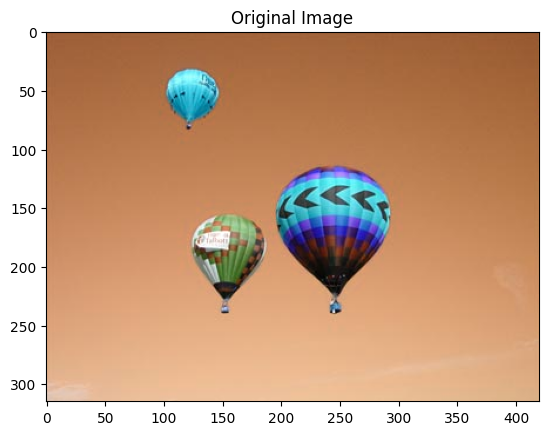

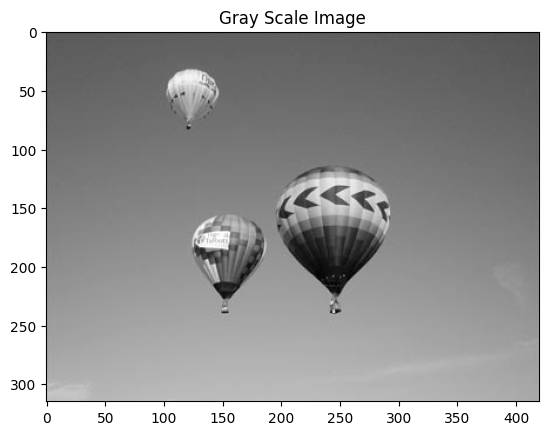

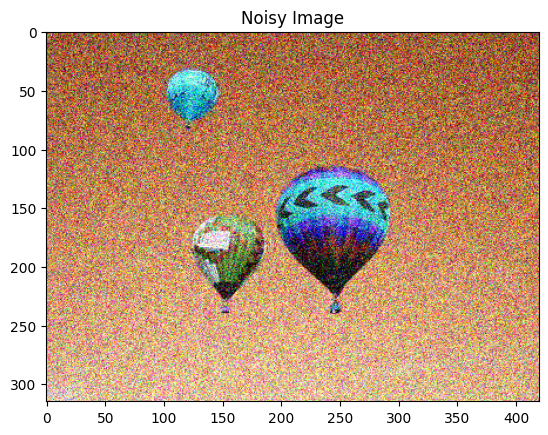

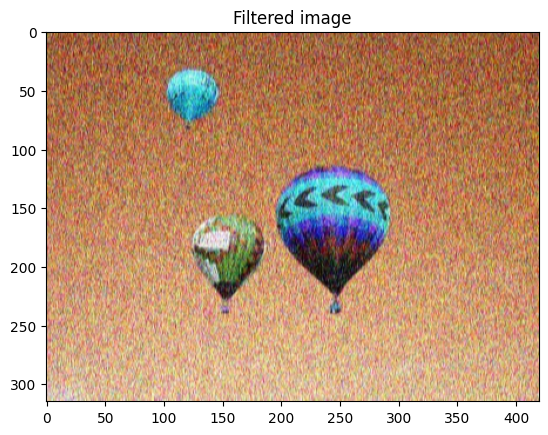

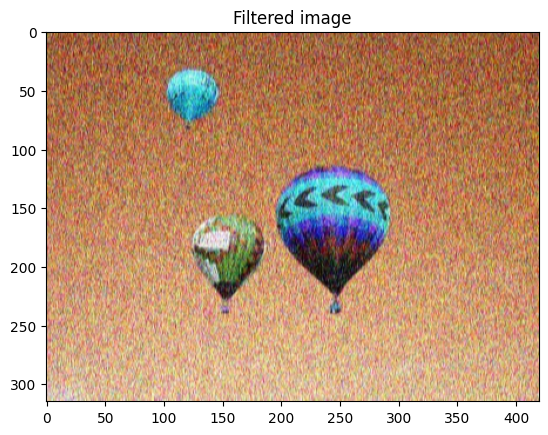

...

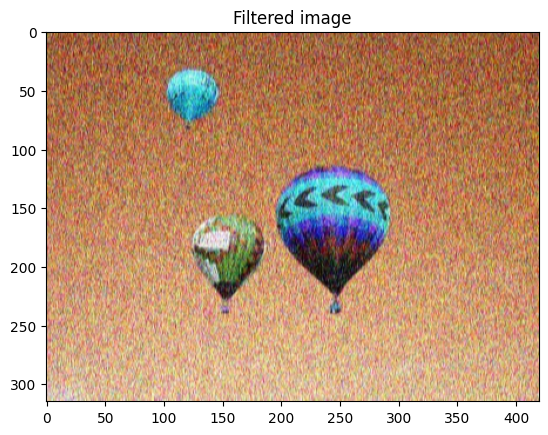

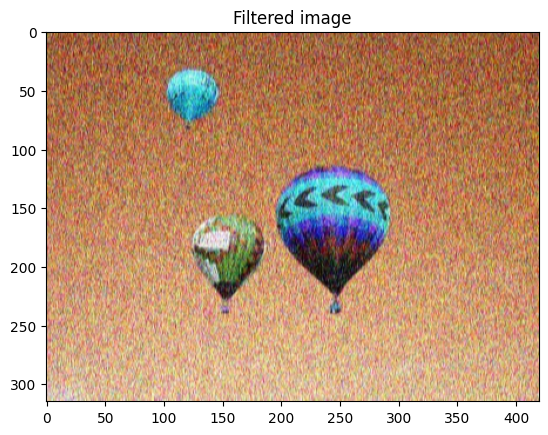

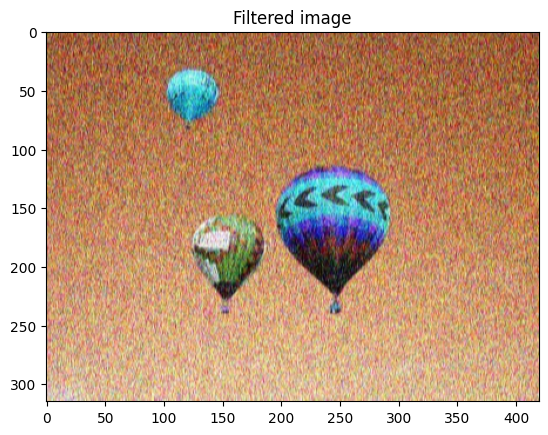

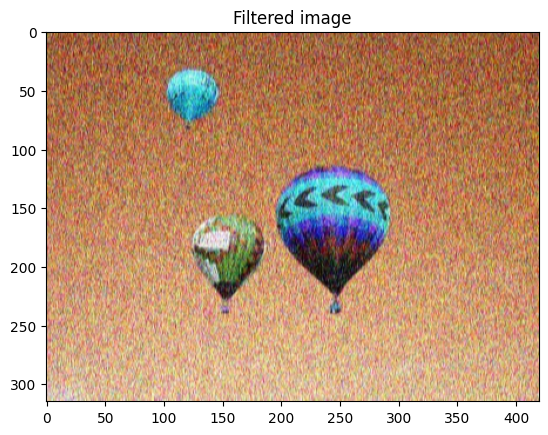

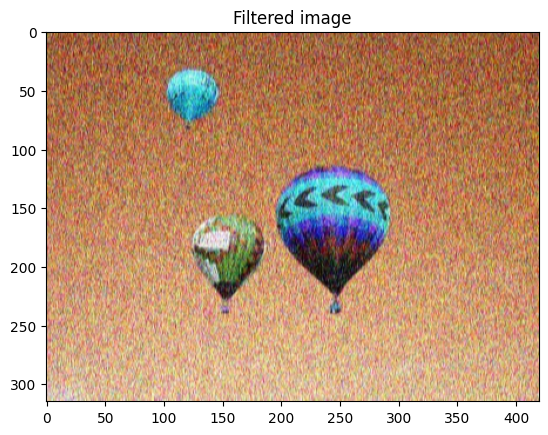

In [10]:
def grayscale(rgb_balloon_image):
  """built-in function to convert RGB to Gray image"""
  gray_balloon_img = cv2.cvtColor(rgb_balloon_image, cv2.COLOR_BGR2GRAY)
  return gray_balloon_img

'''function to add noise in image'''
def add_noise(image, noise_type, noise_level):
  if noise_type == "gaussian":
    noise = np.random.normal(0, noise_level, image.shape)
    noisy_balloon_image = image + noise
    noisy_balloon_image = np.clip(noisy_balloon_image , 0, 255)
    noisy_balloon_image = noisy_balloon_image.astype(np.uint8)

  elif noise_type == "salt_and_pepper":
    noise = np.random.randint(0, 256, image.shape)
    noisy_balloon_image = np.where(noise < noise_level, 0, 255)
  else:
    raise ValueError("Unknown noise type: {}".format(noise_type))

  return noisy_balloon_image

'''Read the balloon.jpg image'''
image = cv2.imread("balloon.jpg")

plt.imshow(image, cmap='gray')
plt.title("Original Image")     # Set the title for the image
plt.show()  # Show the image

'''convert into gray scale and show gray scale image '''
gray_img = grayscale(image)

plt.imshow(gray_img, cmap='gray')
plt.title("Gray Scale Image")
plt.show()

'''Add noise into img and show image'''
noisy_image = add_noise(image, "gaussian", 50)
# Save the noisy image
cv2.imwrite("balloonGrayNoisy.jpg", noisy_image)
plt.imshow(noisy_image, cmap='gray')
plt.title("Noisy Image")
plt.show()

'''Now perform filtering on noisy images'''

def averaging_filter(image, kernel_size):
  kernel = np.ones((kernel_size, kernel_size), dtype=np.float32) / (kernel_size * kernel_size)
  filtered_image = cv2.filter2D(image, -1, kernel)
  return filtered_image

def gaussian_filter(image, kernel_size, sigma=1.0):
  kernel = cv2.getGaussianKernel(kernel_size, sigma)
  filtered_image = cv2.filter2D(image, -1, kernel)
  return filtered_image

#Read the noisy image
noisy_image = cv2.imread("balloonGrayNoisy.jpg")

# Apply averaging and Gaussian filters with filter size 3,5 and 7
filtered_images = []
for kernel_size in range(3, 11, 2):     #range(start value, Stop value, Step value)
  # Averaging filter
  averaging_filtered_image = averaging_filter(noisy_image, kernel_size)
  filtered_images.append(averaging_filtered_image)

  # Gaussian filter
  gaussian_filtered_image = gaussian_filter(noisy_image, kernel_size)
  filtered_images.append(gaussian_filtered_image)

  # Save the filtered images
for i in range(len(filtered_images)):
  cv2.imwrite("balloonGrayFiltered{}.jpg".format(i + 1), filtered_images[i])

for i in range(len(filtered_images)):
  plt.imshow( gaussian_filtered_image, cmap='gray')
  plt.title("Filtered image")
  plt.show()

**Q3:** Perform edge detection on the “linux.jpg” using the Sobel and Prewitt Operators and show the outputs (Convert the image to grayscale, smooth the image using a Gaussian filter, compute horizontal and vertical gradients and then the magnitude of the gradient. Apply a threshold.

 Marks : 8 + 2 points

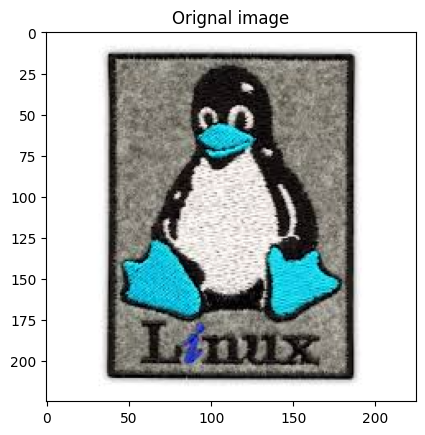

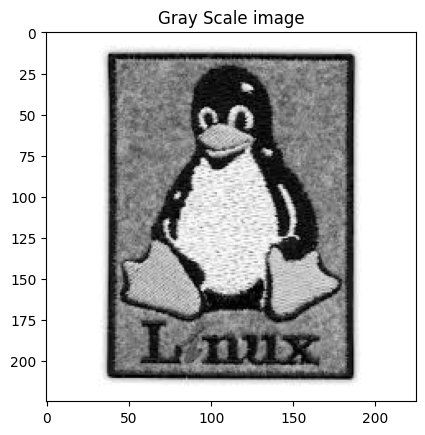

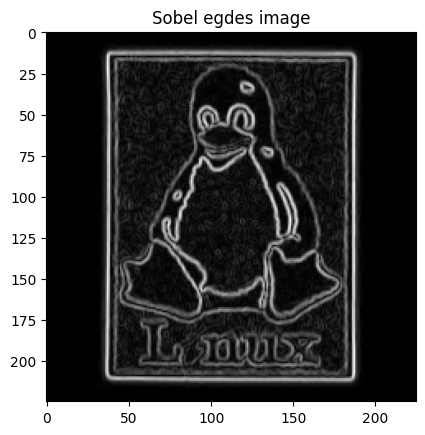

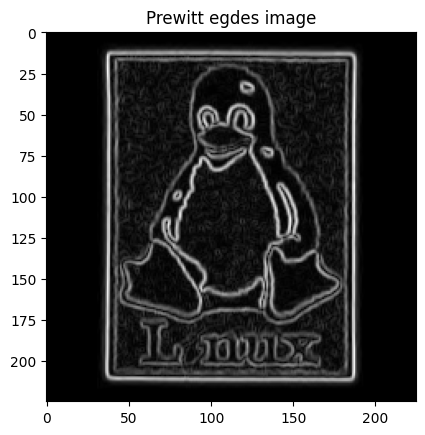

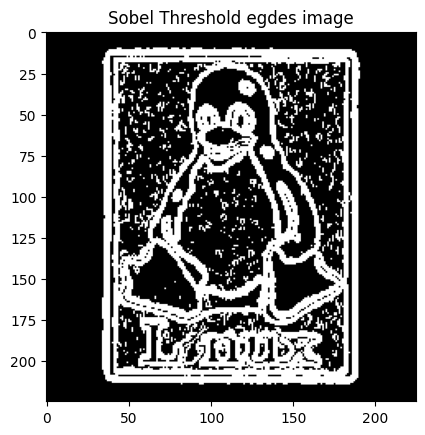

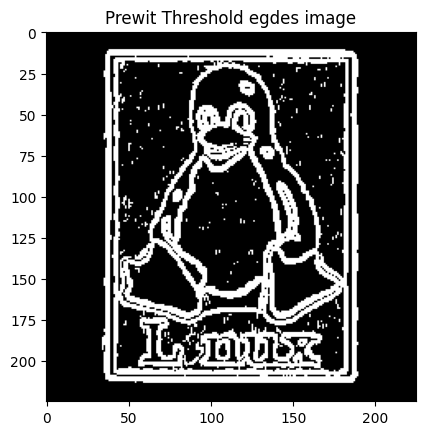

In [11]:
def grayscale(orignal_image):
  """built in to convert image into gray scale img """
  gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  return gray_img

def smooth_image(image, sigma=1.0):
  kernel = cv2.getGaussianKernel(3, sigma)
  smoothed_image = cv2.filter2D(image, -1, kernel)      #smooth img using gausian filter
  return smoothed_image

def sobel_edge_detection(image):
  sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0)
  sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1)
  sobel_magnitude = np.sqrt(sobelx**2 + sobely**2)

  return sobel_magnitude

def prewitt_edge_detection(image):
  prewitt_x = np.array([[1, 0, -1], [1, 0, -1], [1, 0, -1]])
  prewitt_y = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])

  prewitt_x_filtered_image = cv2.filter2D(image, cv2.CV_64F, prewitt_x)
  prewitt_y_filtered_image = cv2.filter2D(image, cv2.CV_64F, prewitt_y)

  prewitt_magnitude = np.sqrt(prewitt_x_filtered_image**2 + prewitt_y_filtered_image**2)

  return prewitt_magnitude

def apply_threshold_on_image(image, threshold=100):
  thresholded_image = np.where(image > threshold, 255, 0).astype("uint8")
  return thresholded_image

image = cv2.imread("linux.jpg")     #read orignal linux image
plt.imshow(image, cmap='gray')
plt.title("Orignal image")
plt.show()

gray_scale = grayscale(image)        # Convert the image to grayscale
plt.imshow(gray_scale, cmap='gray')
plt.title("Gray Scale image")
plt.show()

smoothed_image = smooth_image(gray_scale)

# Display the sobel edge image without threshold
sobel_edges = sobel_edge_detection(smoothed_image)
plt.imshow(sobel_edges, cmap='gray')
plt.title("Sobel egdes image")
plt.show()

prewitt_edges = prewitt_edge_detection(smoothed_image)

# Display the prewitt edge image without threshold
plt.imshow(prewitt_edges, cmap='gray')
plt.title("Prewitt egdes image")
plt.show()

# apply Threshold on the Sobel and Prewitt edge images
sobel_thresholded_edges = apply_threshold_on_image(sobel_edges)
prewitt_thresholded_edges = apply_threshold_on_image(prewitt_edges)

# Display the Sobel edge image after applying threshold
plt.imshow(sobel_thresholded_edges, cmap='gray')
plt.title("Sobel Threshold egdes image")
plt.show()

# Display the prewitt edge image after applying threshold
plt.imshow(prewitt_thresholded_edges, cmap='gray')
plt.title("Prewit Threshold egdes image")
plt.show()


**Q4:** Perform edge detection on the “linux.jpg” using the Laplacian Operators and show the outputs (Convert the image to grayscale, smooth the image using a Gaussian filter, Compute the output image using the Laplacian operator and then apply a threshold)

Marks : 8 + 2 points

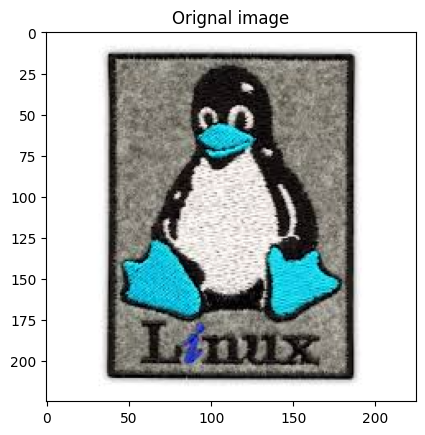

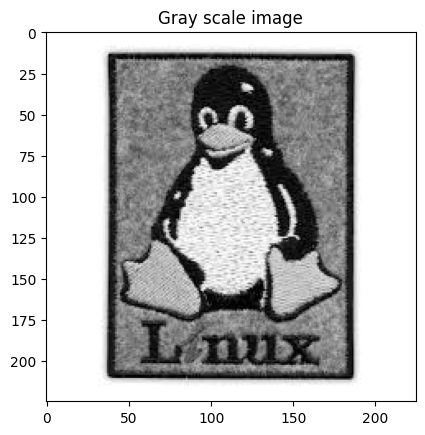

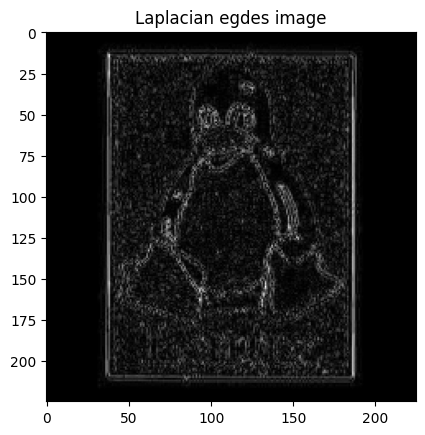

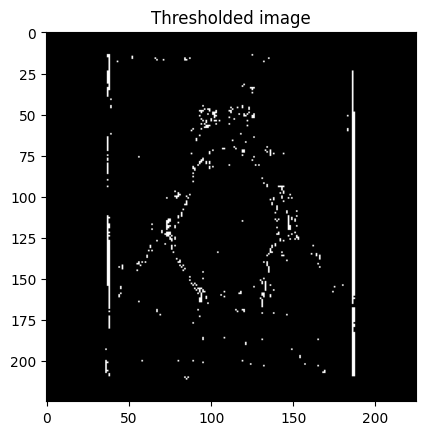

In [12]:
def grayscale(orignal_image):
  """built in to convert image into gray scale img """
  gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  return gray_img

def smooth_image(image, sigma=1.0):
  kernel = cv2.getGaussianKernel(3, sigma)
  smoothed_image = cv2.filter2D(image, -1, kernel)      #smooth img using gausian filter
  return smoothed_image

def laplacian_edge_detector(image):
  laplacian = cv2.Laplacian(image, cv2.CV_64F)
  laplacian_magnitude = np.sqrt(laplacian**2)

  return laplacian_magnitude

def apply_threshold_on_image(image, threshold=100):
  thresholded_image = np.where(image > threshold, 255, 0).astype("uint8")
  return thresholded_image

orignal_image = cv2.imread("linux.jpg")          # Read the "linux.jpg" image
#display orignal img
plt.imshow(orignal_image, cmap='gray')
plt.title("Orignal image")
plt.show()

gray_scale_img = grayscale(image)                # Convert the image to grayscale
#display gray scale img
plt.imshow(gray_scale_img, cmap='gray')
plt.title("Gray scale image")
plt.show()

smoothed_image = smooth_image(gray_scale_img )    # Smooth the image using a Gaussian filter

laplacian_edges = laplacian_edge_detector(smoothed_image)

plt.imshow(laplacian_edges, cmap='gray')
plt.title("Laplacian egdes image")
plt.show()

'''apply threshold on laplacian image'''
lap_thresholded_edges = apply_threshold_on_image(laplacian_edges)

'''display thresholded img '''
plt.imshow(lap_thresholded_edges, cmap='gray')
plt.title("Thresholded image")
plt.show()



**Q5:** Perform edge detection on the linux.jpg using the Canny edge detection algorithm and show the outputs (Convert the image to grayscale, smooth the image using a Gaussian filter, Compute the magnitude and gradient using the Sobal operator, apply non-maximum suppression, and then apply double thresholding (Hysteresis))

**Marks : 8 + 2 points**

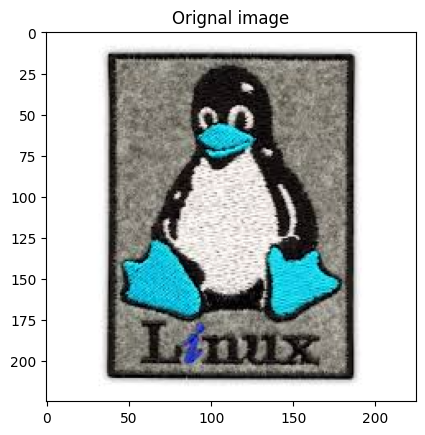

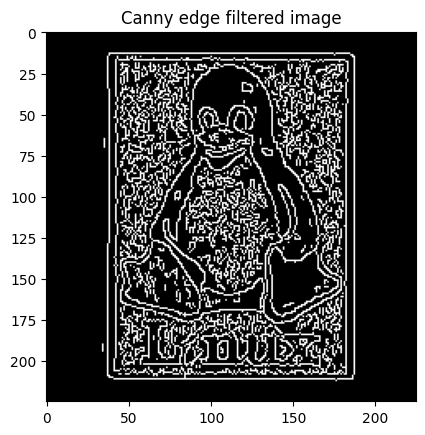

In [13]:
def grayscale(orignal_image):
  """built in to convert image into gray scale img """
  gray_img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  return gray_img

def smooth_image(image, sigma=1.0):
  kernel = cv2.getGaussianKernel(3, sigma)
  smoothed_image = cv2.filter2D(image, -1, kernel)      #smooth img using gausian filter
  return smoothed_image

def sobel_edge_detection(image):
  sobel_grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0)
  sobel_grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1)

  s_magnitude = np.sqrt(sobel_grad_x ** 2 + sobel_grad_y ** 2)
  direction = np.arctan2(sobel_grad_y, sobel_grad_x)

  return s_magnitude

def canny_edge_detection_function(image, low_threshold=50, high_threshold=100):
  gray_img = grayscale(image)                # first step: Convert the image to grayscale

  smoothed_image = smooth_image(gray_img)   # 2nd step: Smooth the image using a Gaussian filter

  sobel_magnitude = sobel_edge_detection(smoothed_image)    #3rd step: calculate magnitude

  # 4th step: Apply non-maximum suppression
  non_max_suppressed_image = cv2.Canny(smoothed_image, low_threshold, high_threshold)

  return non_max_suppressed_image

orignal_image = cv2.imread("linux.jpg")               # Read the "linux.jpg" image
#display orignal img
plt.imshow(orignal_image, cmap='gray')
plt.title("Orignal image")
plt.show()

canny_edges = canny_edge_detection_function(image)
#canny_edges = canny_edge_detection_function(image, 100, 200)

#display img after applying canny edge detection filter
plt.imshow(canny_edges, cmap='gray')
plt.title("Canny edge filtered image")
plt.show()


**Q6:**
Perform the following on the "linux.jpg":
- Split the three channels of rgb image into R,G,B.
- Calculate threshold value by calculating mean in every channel array.
- Apply thresholding on all the three images(R,G,B).
- Merge R,G,B
- Show the results and difference.

**Marks : 8 + 2 points**

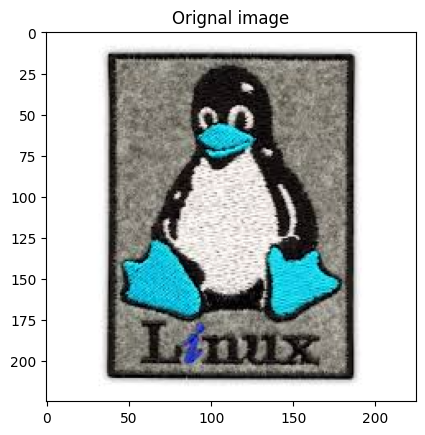

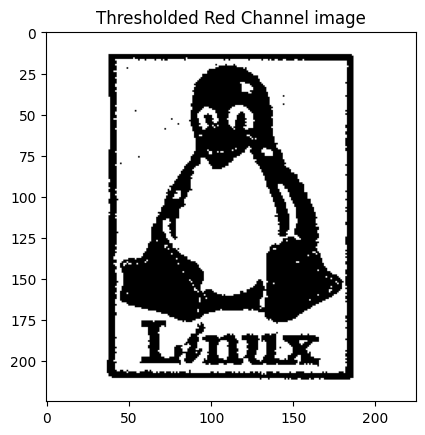

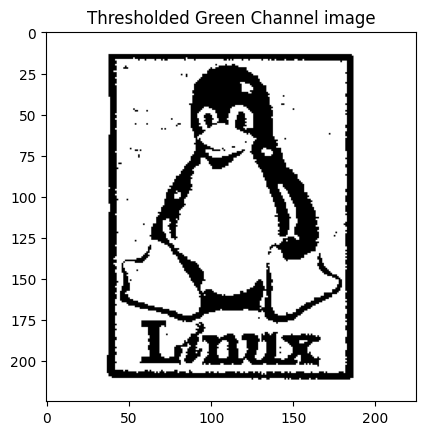

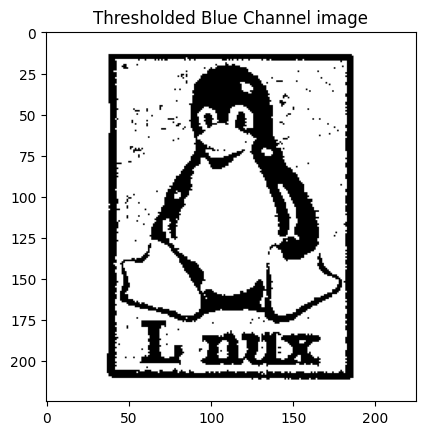

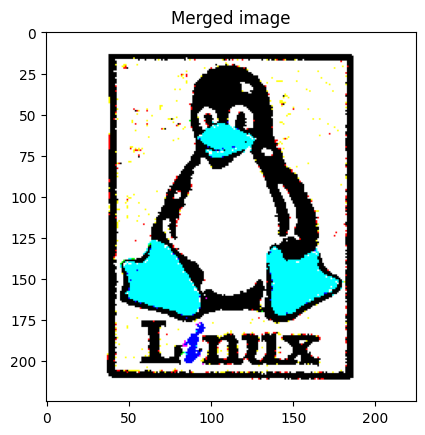

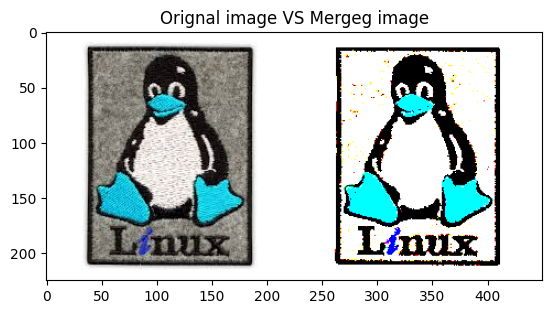

In [14]:
def split_rgb_img_channels(orignal_image):
  red_channel, green_channel, blue_channel = cv2.split(orignal_image)
  return red_channel, green_channel, blue_channel

def calculate_threshold_value(channel_array):
  mean = np.mean(channel_array)
  threshold_value = mean * 0.5
  return threshold_value

def apply_thresholding_on_image(channel_array, threshold):
  thresholded_image = np.where(channel_array > threshold, 255, 0).astype("uint8")
  return thresholded_image

def merge_rgb_channels(red, green, blue):
  merged_image = cv2.merge((red, green, blue))
  return merged_image

orignal_image = cv2.imread("linux.jpg")                           # Read the "linux.jpg" image
#display orignal img
plt.imshow(orignal_image, cmap='gray')
plt.title("Orignal image")
plt.show()

red, green, blue = split_rgb_img_channels(orignal_image)      # Split img into channels

'''# Calculate the threshold value for each channel'''
calculate_r_threshold = calculate_threshold_value(red)
calculate_g_threshold = calculate_threshold_value(green)
calculate_b_threshold = calculate_threshold_value(blue)

'''Apply thresholding to each channel'''
thresholded_r = apply_thresholding_on_image(red, calculate_r_threshold)
#show red img after thresholding apply
plt.imshow(thresholded_r, cmap='gray')
plt.title("Thresholded Red Channel image")
plt.show()

thresholded_g = apply_thresholding_on_image(green, calculate_g_threshold)
#show green img after thresholding apply
plt.imshow(thresholded_g, cmap='gray')
plt.title("Thresholded Green Channel image")
plt.show()

thresholded_b = apply_thresholding_on_image(blue, calculate_b_threshold)
#show blue img after thresholding apply
plt.imshow(thresholded_b, cmap='gray')
plt.title("Thresholded Blue Channel image")
plt.show()

'''# Merge the thresholded channels'''
merged_thresholded_image = merge_rgb_channels(thresholded_r, thresholded_g, thresholded_b)
#display merged image
plt.imshow(merged_thresholded_image, cmap='gray')
plt.title("Merged image")
plt.show()

#show orignal and merged image side by side
side_by_side_image = np.hstack([orignal_image, merged_thresholded_image])

plt.imshow(side_by_side_image , cmap='gray')
plt.title("Orignal image VS Mergeg image")
plt.show()


Q7:
You are required to implement a padding function that takes a 2D image as input, a padding size and display both the images(with padding and without padding)
You are not allowed to use the numpy.pad function.

**Marks : 8 + 2 points**

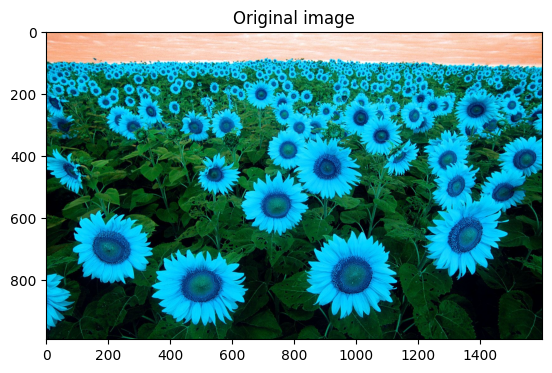

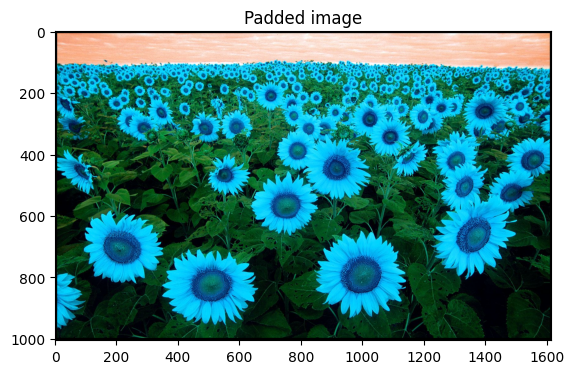

In [15]:
def add_padding_on_image(image, padding_size):

  padded_image = np.zeros((image.shape[0] + padding_size[0] * 2,
                           image.shape[1] + padding_size[1] * 2,
                           image.shape[2]),
                          dtype=image.dtype)

  padded_image[padding_size[0]:image.shape[0] + padding_size[0],
               padding_size[1]:image.shape[1] + padding_size[1]] = image

  return padded_image

original_image = cv2.imread("flower.jpg")

padded_image = add_padding_on_image(original_image, (7, 7))

# Display the original image.
plt.imshow(original_image, cmap='gray')
plt.title("Original image")
plt.show()

# Display the padded image.
plt.imshow(padded_image, cmap='gray')
plt.title("Padded image")
plt.show()



**Q8:**
 Perform canny edge detection on video.
- Record your own video of maximum 30 seconds.
- Apply canny edge detection.
- Also send the processed video along with code file.

**Marks : 35 + 5 points**

In [ ]:
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(0)
while True:
  ret, frame = cap.read()
  if ret:
    # Convert the frame to grayscale.
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection.
    edges = cv2.Canny(gray, 50, 150)

    # Display the original and edge-detected frames.
    plt.imshow(frame, cmap='gray')
    plt.title("Original")
    plt.show()

    plt.imshow(edges, cmap='gray')
    plt.title("Edges")
    plt.show()

    # Press 'q' to quit.
    if cv2.waitKey(1) == ord('q'):
      break
    else:
        break

cap.release()
cv2.destroyAllWindows()

# Create a video writer object.
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, 20.0, (640, 480))

# Capture the video.
cap = cv2.VideoCapture(0)

# Loop over the video frames for 30 seconds.
for i in range(5 * 20):
  ret, frame = cap.read()
  if ret:
    # Write the frame to the video file.
    out.write(frame)

# Release the video capture and video writer objects.
cap.release()
out.release()

# Read the recorded video.
cap = cv2.VideoCapture('output.mp4')

# Create a video writer object to save the processed video.
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('processed_output.mp4', fourcc, 20.0, (640, 480))

# Loop over the video frames.
while True:
  ret, frame = cap.read()
  if ret:
    # Convert the frame to grayscale.
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection.
    edges = cv2.Canny(gray, 50, 150)

    # Write the edge-detected frame to the video file.
    out.write(edges)

    # Press 'q' to quit.
    if cv2.waitKey(1) == ord('q'):
      break
  else:
    break

# Release the video capture and video writer objects.
cap.release()
out.release()

def canny_edge_detection(video_path, output_path):
  """Performs Canny edge detection on a video and saves the output video to the specified output path.

  Args:
    video_path: The path to the input video.
    output_path: The path to the output video.
  """

  # Read the input video.
  cap = cv2.VideoCapture(video_path)

  # Create a video writer object to save the processed video.
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  out = cv2.VideoWriter(output_path, fourcc, 20.0, (cap.get(cv2.CAP_PROP_FRAME_WIDTH), cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))

  # Loop over the video frames.
  while True:
    ret, frame = cap.read()
    if ret:
      # Convert the frame to grayscale.
      gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

      # Apply Canny edge detection.
      edges = cv2.Canny(gray, 50, 150)

      # Write the edge-detected frame to the video file.
      out.write(edges)

      # Press 'q' to quit.
      if cv2.waitKey(1) == ord('q'):
        break
    else:
      break

  # Release the video capture and video writer objects.
  cap.release()
  out.release()

if __name__ == '__main__':
  # Get the input and output video paths from the user.
  video_path = input('Enter the path to the input video: ')
  output_path = input('Enter the path to the output video: ')

  # Perform Canny edge detection on the video.
  canny_edge_detection(video_path, output_path)

  # Print a success message.
  print('Successfully processed the video and saved the output to {}.'.format(output_path))